Adding Gaussian Noise to an image.

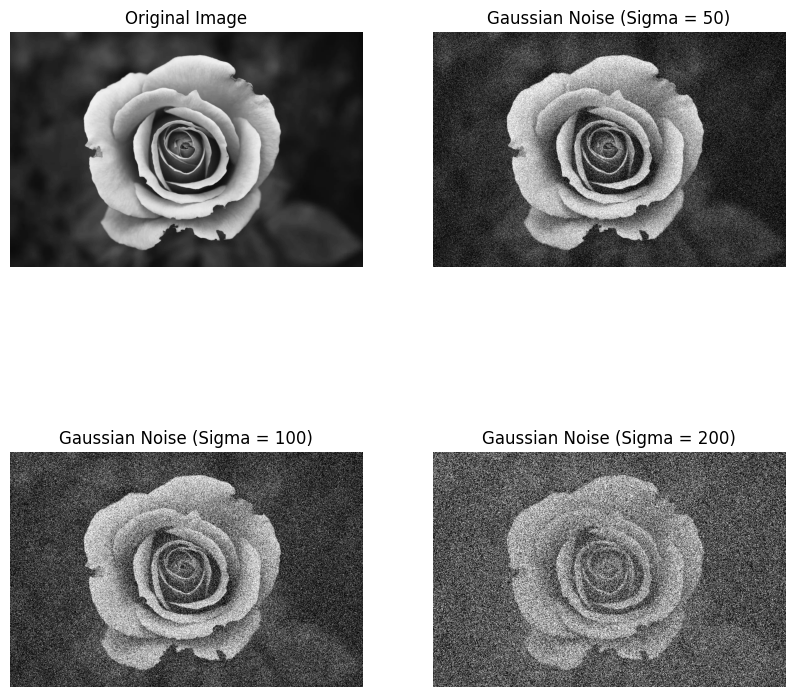

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2
import numpy as np
from PIL import Image

notebook_dir = os.path.dirname(os.path.abspath('__file__'))
image_filename = 'image_2.jpeg'
image_path = os.path.join(notebook_dir, 'images', image_filename)

image = Image.open(image_path).convert('L') 
image_array = np.array(image)

mean = 0
stddev = 50  
gaussian_noise = np.random.normal(mean, stddev, image_array.shape)
noisy_image_array = np.clip(image_array + gaussian_noise, 0, 255).astype(np.uint8)

mean = 0
stddev = 100 
gaussian_noise2 = np.random.normal(mean, stddev, image_array.shape)
noisy_image_array2 = np.clip(image_array + gaussian_noise2, 0, 255).astype(np.uint8)

mean = 0
stddev = 200 
gaussian_noise3 = np.random.normal(mean, stddev, image_array.shape)
noisy_image_array3 = np.clip(image_array + gaussian_noise3, 0, 255).astype(np.uint8)

fig, axes = plt.subplots(2, 2, figsize=(10, 10))  
axes[0, 0].imshow(image_array, cmap='gray')
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')

axes[0, 1].imshow(noisy_image_array, cmap='gray')
axes[0, 1].set_title('Gaussian Noise (Sigma = 50)')
axes[0, 1].axis('off')

axes[1, 0].imshow(noisy_image_array2, cmap='gray')
axes[1, 0].set_title('Gaussian Noise (Sigma = 100)')
axes[1, 0].axis('off')

axes[1, 1].imshow(noisy_image_array3, cmap='gray')
axes[1, 1].set_title('Gaussian Noise (Sigma = 200)')
axes[1, 1].axis('off')

plt.show()

Adding Poisson Noise to the image.

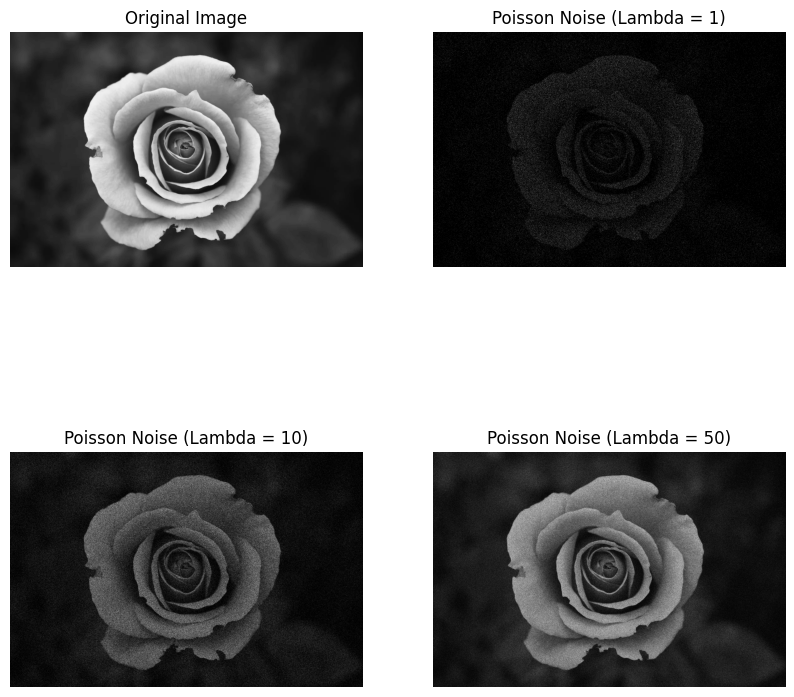

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2
import numpy as np
from PIL import Image

notebook_dir = os.path.dirname(os.path.abspath('__file__'))
image_filename = 'image_2.jpeg'
image_path = os.path.join(notebook_dir, 'images', image_filename)

image = Image.open(image_path).convert('L')  
image_array = np.array(image)

lambda1 = 1  # 
noisy_image_array1 = np.random.poisson(image_array / 255.0 * lambda1) / lambda1 * 255

lambda2 = 10 
noisy_image_array2 = np.random.poisson(image_array / 255.0 * lambda2) / lambda2 * 255

lambda3 = 50 
noisy_image_array3 = np.random.poisson(image_array / 255.0 * lambda3) / lambda3 * 255

fig, axes = plt.subplots(2, 2, figsize=(10, 10)) 

axes[0, 0].imshow(image_array, cmap='gray')
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')

axes[0, 1].imshow(noisy_image_array1, cmap='gray')
axes[0, 1].set_title('Poisson Noise (Lambda = 1)')
axes[0, 1].axis('off')

axes[1, 0].imshow(noisy_image_array2, cmap='gray')
axes[1, 0].set_title('Poisson Noise (Lambda = 10)')
axes[1, 0].axis('off')

axes[1, 1].imshow(noisy_image_array3, cmap='gray')
axes[1, 1].set_title('Poisson Noise (Lambda = 50)')
axes[1, 1].axis('off')

plt.show()

Adding Random Noise to the image and measuring Signal-to-Noise Ratio and Peak Signal-to-Noise Ratio of noisy images.

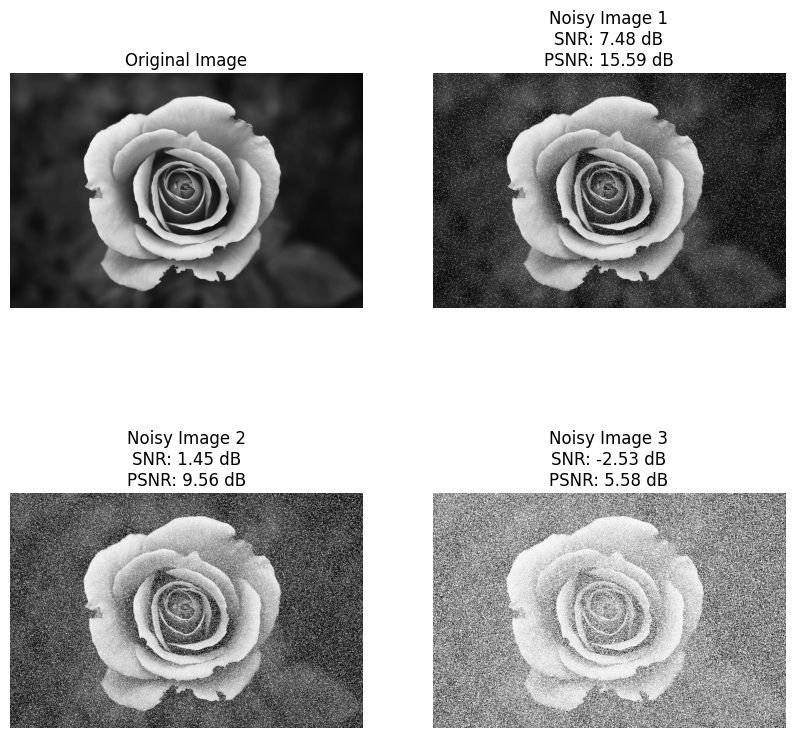

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2
import numpy as np
from PIL import Image

notebook_dir = os.path.dirname(os.path.abspath('__file__'))
image_filename = 'image_2.jpeg'
image_path = os.path.join(notebook_dir, 'images', image_filename)

image = Image.open(image_path).convert('L')
image_array = np.array(image)

prob1 = 0.05  
salt_pepper_noise1 = np.random.choice([0, 255], size=image_array.shape, p=[1-prob1, prob1])
noisy_image_array1 = np.where(salt_pepper_noise1 == 255, 255, image_array)

prob2 = 0.20  
salt_pepper_noise2 = np.random.choice([0, 255], size=image_array.shape, p=[1-prob2, prob2])
noisy_image_array2 = np.where(salt_pepper_noise2 == 255, 255, image_array)

prob3 = 0.50  
salt_pepper_noise3 = np.random.choice([0, 255], size=image_array.shape, p=[1-prob3, prob3])
noisy_image_array3 = np.where(salt_pepper_noise3 == 255, 255, image_array)

original_image = image_array.astype(np.float64)
snr1 = 10 * np.log10(np.mean(original_image ** 2) / np.mean((noisy_image_array1 - original_image) ** 2))
psnr1 = 10 * np.log10(255 ** 2 / np.mean((noisy_image_array1 - original_image) ** 2))

snr2 = 10 * np.log10(np.mean(original_image ** 2) / np.mean((noisy_image_array2 - original_image) ** 2))
psnr2 = 10 * np.log10(255 ** 2 / np.mean((noisy_image_array2 - original_image) ** 2))

snr3 = 10 * np.log10(np.mean(original_image ** 2) / np.mean((noisy_image_array3 - original_image) ** 2))
psnr3 = 10 * np.log10(255 ** 2 / np.mean((noisy_image_array3 - original_image) ** 2))

fig, axes = plt.subplots(2, 2, figsize=(10, 10)) 

axes[0, 0].imshow(image_array, cmap='gray')
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')

axes[0, 1].imshow(noisy_image_array1, cmap='gray')
axes[0, 1].set_title(f'Noisy Image 1\nSNR: {snr1:.2f} dB\nPSNR: {psnr1:.2f} dB')
axes[0, 1].axis('off')

axes[1, 0].imshow(noisy_image_array2, cmap='gray')
axes[1, 0].set_title(f'Noisy Image 2\nSNR: {snr2:.2f} dB\nPSNR: {psnr2:.2f} dB')
axes[1, 0].axis('off')

axes[1, 1].imshow(noisy_image_array3, cmap='gray')
axes[1, 1].set_title(f'Noisy Image 3\nSNR: {snr3:.2f} dB\nPSNR: {psnr3:.2f} dB')
axes[1, 1].axis('off')

plt.show()


Adding Gaussian Noise to the image and denoising it using Mean Filter.

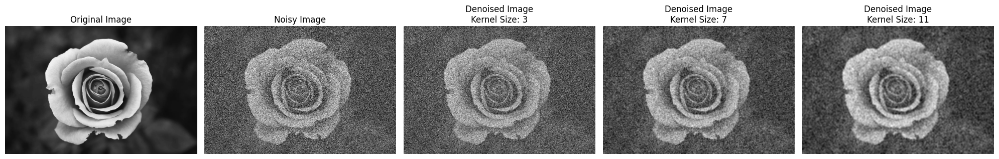

In [4]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image
import os

notebook_dir = os.path.dirname(os.path.abspath('__file__'))
image_filename = 'image_2.jpeg'
image_path = os.path.join(notebook_dir, 'images', image_filename)

image = Image.open(image_path).convert('L') 
image_array = np.array(image)

mean = 0
stddev = 200  
gaussian_noise = np.random.normal(mean, stddev, image_array.shape)
noisy_image_array = np.clip(image_array + gaussian_noise, 0, 255).astype(np.uint8)

kernel_sizes = [3, 7, 11]  
denoised_images = []
for kernel_size in kernel_sizes:
    denoised_image_array = cv2.blur(noisy_image_array, (kernel_size, kernel_size))
    denoised_images.append(denoised_image_array)

num_plots = len(kernel_sizes) + 2
fig, axes = plt.subplots(1, num_plots, figsize=(4 * num_plots, 4))

axes[0].imshow(image_array, cmap='gray')
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(noisy_image_array, cmap='gray')
axes[1].set_title('Noisy Image')
axes[1].axis('off')

for i in range(len(kernel_sizes)):
    axes[i + 2].imshow(denoised_images[i], cmap='gray')
    axes[i + 2].set_title(f'Denoised Image\nKernel Size: {kernel_sizes[i]}')
    axes[i + 2].axis('off')

plt.tight_layout()
plt.show()


Adding Gaussian Noise to the image and denoising it using Mean Filter.

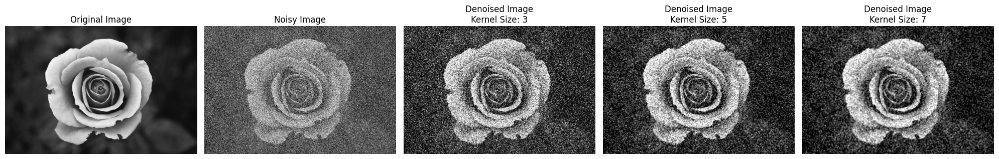

In [5]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image
import os

notebook_dir = os.path.dirname(os.path.abspath('__file__'))
image_filename = 'image_2.jpeg'
image_path = os.path.join(notebook_dir, 'images', image_filename)

image = Image.open(image_path).convert('L') 
image_array = np.array(image)

mean = 0
stddev = 200  
gaussian_noise = np.random.normal(mean, stddev, image_array.shape)
noisy_image_array = np.clip(image_array + gaussian_noise, 0, 255).astype(np.uint8)

kernel_sizes = [3, 5, 7]  
denoised_images = []
for kernel_size in kernel_sizes:
    denoised_image_array = cv2.medianBlur(noisy_image_array, kernel_size)
    denoised_images.append(denoised_image_array)

num_plots = len(kernel_sizes) + 2
fig, axes = plt.subplots(1, num_plots, figsize=(4 * num_plots, 4))

axes[0].imshow(image_array, cmap='gray')
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(noisy_image_array, cmap='gray')
axes[1].set_title('Noisy Image')
axes[1].axis('off')

for i in range(len(kernel_sizes)):
    axes[i + 2].imshow(denoised_images[i], cmap='gray')
    axes[i + 2].set_title(f'Denoised Image\nKernel Size: {kernel_sizes[i]}')
    axes[i + 2].axis('off')

plt.tight_layout()
plt.show()


Finding optimal kernel size...

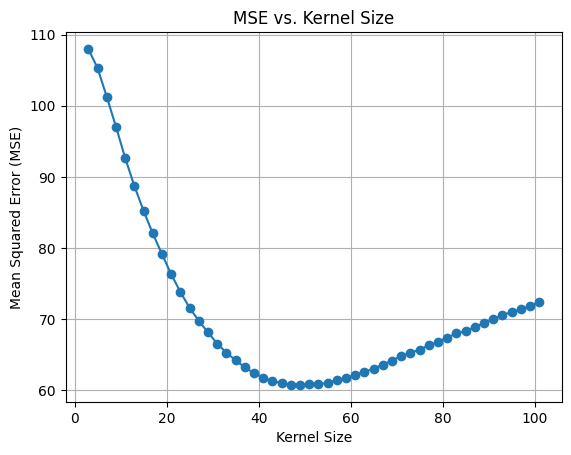

In [6]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image
import os

notebook_dir = os.path.dirname(os.path.abspath('__file__'))

image_filename = 'image_2.jpeg'
image_path = os.path.join(notebook_dir, 'images', image_filename)

image = Image.open(image_path).convert('L')
image_array = np.array(image)

mean = 0
stddev = 200 
gaussian_noise = np.random.normal(mean, stddev, image_array.shape)
noisy_image_array = np.clip(image_array + gaussian_noise, 0, 255).astype(np.uint8)

kernel_sizes = range(3, 103, 2)  
denoised_images = []
mse_values = []
for kernel_size in kernel_sizes:
    denoised_image_array = cv2.medianBlur(noisy_image_array, kernel_size)
    denoised_images.append(denoised_image_array)
    mse = np.mean((denoised_image_array - image_array) ** 2)
    mse_values.append(mse)

plt.plot(kernel_sizes, mse_values, marker='o')
plt.xlabel('Kernel Size')
plt.ylabel('Mean Squared Error (MSE)')
plt.title('MSE vs. Kernel Size')
plt.grid(True)
plt.show()


Plotting the best result versus others.

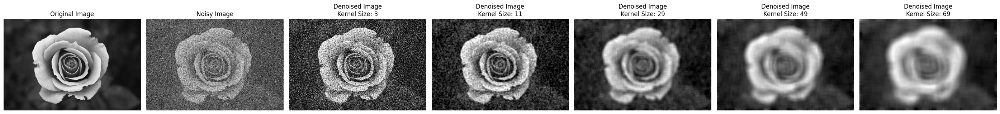

In [7]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image
import os

notebook_dir = os.path.dirname(os.path.abspath('__file__'))
image_filename = 'image_2.jpeg'
image_path = os.path.join(notebook_dir, 'images', image_filename)

image = Image.open(image_path).convert('L') 
image_array = np.array(image)

mean = 0
stddev = 200  
gaussian_noise = np.random.normal(mean, stddev, image_array.shape)
noisy_image_array = np.clip(image_array + gaussian_noise, 0, 255).astype(np.uint8)

kernel_sizes = [3, 11, 29, 49, 69]  
denoised_images = []
for kernel_size in kernel_sizes:
    denoised_image_array = cv2.medianBlur(noisy_image_array, kernel_size)
    denoised_images.append(denoised_image_array)

num_plots = len(kernel_sizes) + 2
fig, axes = plt.subplots(1, num_plots, figsize=(4 * num_plots, 4))

axes[0].imshow(image_array, cmap='gray')
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(noisy_image_array, cmap='gray')
axes[1].set_title('Noisy Image')
axes[1].axis('off')

for i in range(len(kernel_sizes)):
    axes[i + 2].imshow(denoised_images[i], cmap='gray')
    axes[i + 2].set_title(f'Denoised Image\nKernel Size: {kernel_sizes[i]}')
    axes[i + 2].axis('off')

plt.tight_layout()
plt.show()


Similarly to the "astronaut" results from the Exercise, "optimally denoised" image catches a lot of color on the edges, but blurres the image a lot. In this case, since those details and colors are not that important, smaller kernel sizes do better job.

Adding some Salt-n-Pepper noise to the image, and denoising using Median Filter.

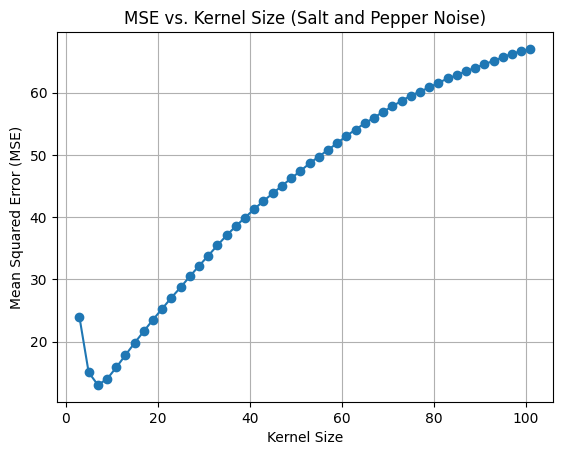

In [8]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image
import os

notebook_dir = os.path.dirname(os.path.abspath('__file__'))
image_filename = 'image_2.jpeg'
image_path = os.path.join(notebook_dir, 'images', image_filename)

image = Image.open(image_path).convert('L')
image_array = np.array(image)

salt_vs_pepper = 0.5
noise_amount = 0.70
salt_pepper_mask = np.random.rand(*image_array.shape) < noise_amount / 2
pepper_mask = salt_pepper_mask & (image_array < 255 * salt_vs_pepper)
salt_mask = salt_pepper_mask & (image_array >= 255 * (1 - salt_vs_pepper))
image_array_noise = image_array.copy()
image_array_noise[pepper_mask] = 0
image_array_noise[salt_mask] = 255

kernel_sizes = range(3, 103, 2)
denoised_images = []
mse_values = []
for kernel_size in kernel_sizes:
    denoised_image_array = cv2.medianBlur(image_array_noise, kernel_size)
    denoised_images.append(denoised_image_array)
    mse = np.mean((denoised_image_array - image_array) ** 2)
    mse_values.append(mse)

plt.plot(kernel_sizes, mse_values, marker='o')
plt.xlabel('Kernel Size')
plt.ylabel('Mean Squared Error (MSE)')
plt.title('MSE vs. Kernel Size (Salt and Pepper Noise)')
plt.grid(True)
plt.show()


Using Median Filter denoising for different percentages of Salt-n-Pepper Noise...

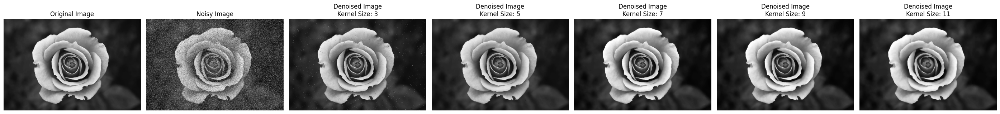

In [9]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image
import os

notebook_dir = os.path.dirname(os.path.abspath('__file__'))
image_filename = 'image_2.jpeg'
image_path = os.path.join(notebook_dir, 'images', image_filename)

image = Image.open(image_path).convert('L')
image_array = np.array(image)

salt_vs_pepper = 0.5
noise_amount = 0.25
salt_pepper_mask = np.random.rand(*image_array.shape) < noise_amount
pepper_mask = salt_pepper_mask & (np.random.rand(*image_array.shape) < salt_vs_pepper)
salt_mask = salt_pepper_mask & ~pepper_mask
image_array_noise = image_array.copy()
image_array_noise[pepper_mask] = 0
image_array_noise[salt_mask] = 255

kernel_sizes = range(3, 13, 2)
denoised_images = []
mse_values = []
for kernel_size in kernel_sizes:
    denoised_image_array = cv2.medianBlur(image_array_noise, kernel_size)
    denoised_images.append(denoised_image_array)
    mse = np.mean((denoised_image_array - image_array) ** 2)
    mse_values.append(mse)

num_plots = len(kernel_sizes) + 2
fig, axes = plt.subplots(1, num_plots, figsize=(4 * num_plots, 4))

axes[0].imshow(image_array, cmap='gray')
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(image_array_noise, cmap='gray')
axes[1].set_title('Noisy Image')
axes[1].axis('off')

for i in range(len(kernel_sizes)):
    axes[i + 2].imshow(denoised_images[i], cmap='gray')
    axes[i + 2].set_title(f'Denoised Image\nKernel Size: {kernel_sizes[i]}')
    axes[i + 2].axis('off')

plt.tight_layout()
plt.show()


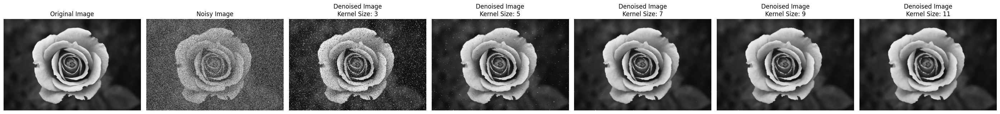

In [10]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image
import os

notebook_dir = os.path.dirname(os.path.abspath('__file__'))
image_filename = 'image_2.jpeg'
image_path = os.path.join(notebook_dir, 'images', image_filename)

image = Image.open(image_path).convert('L')
image_array = np.array(image)

salt_vs_pepper = 0.5
noise_amount = 0.50
salt_pepper_mask = np.random.rand(*image_array.shape) < noise_amount
pepper_mask = salt_pepper_mask & (np.random.rand(*image_array.shape) < salt_vs_pepper)
salt_mask = salt_pepper_mask & ~pepper_mask
image_array_noise = image_array.copy()
image_array_noise[pepper_mask] = 0
image_array_noise[salt_mask] = 255

kernel_sizes = range(3, 13, 2)
denoised_images = []
mse_values = []
for kernel_size in kernel_sizes:
    denoised_image_array = cv2.medianBlur(image_array_noise, kernel_size)
    denoised_images.append(denoised_image_array)
    mse = np.mean((denoised_image_array - image_array) ** 2)
    mse_values.append(mse)

num_plots = len(kernel_sizes) + 2
fig, axes = plt.subplots(1, num_plots, figsize=(4 * num_plots, 4))

axes[0].imshow(image_array, cmap='gray')
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(image_array_noise, cmap='gray')
axes[1].set_title('Noisy Image')
axes[1].axis('off')

for i in range(len(kernel_sizes)):
    axes[i + 2].imshow(denoised_images[i], cmap='gray')
    axes[i + 2].set_title(f'Denoised Image\nKernel Size: {kernel_sizes[i]}')
    axes[i + 2].axis('off')

plt.tight_layout()
plt.show()


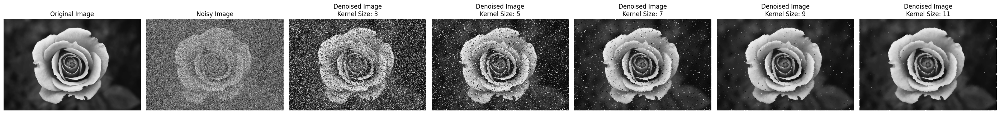

In [11]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image
import os

notebook_dir = os.path.dirname(os.path.abspath('__file__'))
image_filename = 'image_2.jpeg'
image_path = os.path.join(notebook_dir, 'images', image_filename)

image = Image.open(image_path).convert('L')
image_array = np.array(image)

salt_vs_pepper = 0.5
noise_amount = 0.70
salt_pepper_mask = np.random.rand(*image_array.shape) < noise_amount
pepper_mask = salt_pepper_mask & (np.random.rand(*image_array.shape) < salt_vs_pepper)
salt_mask = salt_pepper_mask & ~pepper_mask
image_array_noise = image_array.copy()
image_array_noise[pepper_mask] = 0
image_array_noise[salt_mask] = 255

kernel_sizes = range(3, 13, 2)
denoised_images = []
mse_values = []
for kernel_size in kernel_sizes:
    denoised_image_array = cv2.medianBlur(image_array_noise, kernel_size)
    denoised_images.append(denoised_image_array)
    mse = np.mean((denoised_image_array - image_array) ** 2)
    mse_values.append(mse)

num_plots = len(kernel_sizes) + 2
fig, axes = plt.subplots(1, num_plots, figsize=(4 * num_plots, 4))

axes[0].imshow(image_array, cmap='gray')
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(image_array_noise, cmap='gray')
axes[1].set_title('Noisy Image')
axes[1].axis('off')

for i in range(len(kernel_sizes)):
    axes[i + 2].imshow(denoised_images[i], cmap='gray')
    axes[i + 2].set_title(f'Denoised Image\nKernel Size: {kernel_sizes[i]}')
    axes[i + 2].axis('off')

plt.tight_layout()
plt.show()


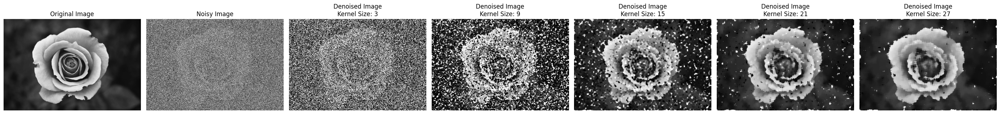

In [12]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image
import os

notebook_dir = os.path.dirname(os.path.abspath('__file__'))
image_filename = 'image_2.jpeg'
image_path = os.path.join(notebook_dir, 'images', image_filename)

image = Image.open(image_path).convert('L')
image_array = np.array(image)

salt_vs_pepper = 0.5
noise_amount = 0.90
salt_pepper_mask = np.random.rand(*image_array.shape) < noise_amount
pepper_mask = salt_pepper_mask & (np.random.rand(*image_array.shape) < salt_vs_pepper)
salt_mask = salt_pepper_mask & ~pepper_mask
image_array_noise = image_array.copy()
image_array_noise[pepper_mask] = 0
image_array_noise[salt_mask] = 255

kernel_sizes = range(3, 33, 6)
denoised_images = []
mse_values = []
for kernel_size in kernel_sizes:
    denoised_image_array = cv2.medianBlur(image_array_noise, kernel_size)
    denoised_images.append(denoised_image_array)
    mse = np.mean((denoised_image_array - image_array) ** 2)
    mse_values.append(mse)

num_plots = len(kernel_sizes) + 2
fig, axes = plt.subplots(1, num_plots, figsize=(4 * num_plots, 4))

axes[0].imshow(image_array, cmap='gray')
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(image_array_noise, cmap='gray')
axes[1].set_title('Noisy Image')
axes[1].axis('off')

for i in range(len(kernel_sizes)):
    axes[i + 2].imshow(denoised_images[i], cmap='gray')
    axes[i + 2].set_title(f'Denoised Image\nKernel Size: {kernel_sizes[i]}')
    axes[i + 2].axis('off')

plt.tight_layout()
plt.show()


Median Filter denoising seem to work very well on Salt-n-Pepper noise.

Let's now apply TV-Regularization denoising.

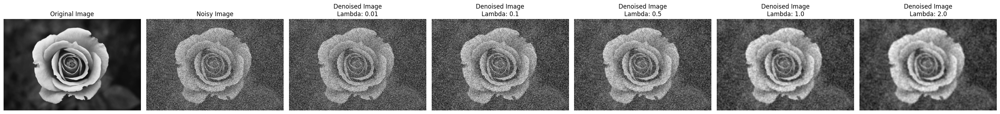

In [13]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image
import os
from skimage.restoration import denoise_tv_chambolle

notebook_dir = os.path.dirname(os.path.abspath('__file__'))
image_filename = 'image_2.jpeg'
image_path = os.path.join(notebook_dir, 'images', image_filename)

image = Image.open(image_path).convert('L')
image_array = np.array(image)

salt_vs_pepper = 0.5
noise_amount = 0.50
salt_pepper_mask = np.random.rand(*image_array.shape) < noise_amount
pepper_mask = salt_pepper_mask & (np.random.rand(*image_array.shape) < salt_vs_pepper)
salt_mask = salt_pepper_mask & ~pepper_mask
image_array_noise = image_array.copy()
image_array_noise[pepper_mask] = 0
image_array_noise[salt_mask] = 255

lambda_values = [0.01, 0.1, 0.5, 1.0, 2.0]  # Adjust the lambda values as desired
denoised_images = []

for lambda_val in lambda_values:
    denoised_image_array = denoise_tv_chambolle(image_array_noise, weight=lambda_val)
    denoised_images.append(denoised_image_array)

num_plots = len(lambda_values) + 2
fig, axes = plt.subplots(1, num_plots, figsize=(4 * num_plots, 4))

axes[0].imshow(image_array, cmap='gray')
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(image_array_noise, cmap='gray')
axes[1].set_title('Noisy Image')
axes[1].axis('off')

for i in range(len(lambda_values)):
    axes[i + 2].imshow(denoised_images[i], cmap='gray')
    axes[i + 2].set_title(f'Denoised Image\nLambda: {lambda_values[i]}')
    axes[i + 2].axis('off')

plt.tight_layout()
plt.show()


Let's try a more polluted image.

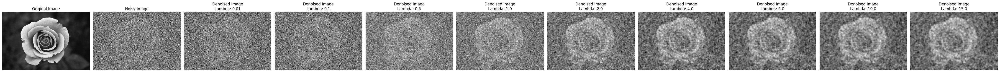

In [14]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image
import os
from skimage.restoration import denoise_tv_chambolle

notebook_dir = os.path.dirname(os.path.abspath('__file__'))
image_filename = 'image_2.jpeg'
image_path = os.path.join(notebook_dir, 'images', image_filename)

image = Image.open(image_path).convert('L')
image_array = np.array(image)

salt_vs_pepper = 0.5
noise_amount = 0.90
salt_pepper_mask = np.random.rand(*image_array.shape) < noise_amount
pepper_mask = salt_pepper_mask & (np.random.rand(*image_array.shape) < salt_vs_pepper)
salt_mask = salt_pepper_mask & ~pepper_mask
image_array_noise = image_array.copy()
image_array_noise[pepper_mask] = 0
image_array_noise[salt_mask] = 255

lambda_values = [0.01, 0.1, 0.5, 1.0, 2.0, 4.0, 6.0, 10.0, 15.0]  # Adjust the lambda values as desired
denoised_images = []

for lambda_val in lambda_values:
    denoised_image_array = denoise_tv_chambolle(image_array_noise, weight=lambda_val)
    denoised_images.append(denoised_image_array)

num_plots = len(lambda_values) + 2
fig, axes = plt.subplots(1, num_plots, figsize=(4 * num_plots, 4))

axes[0].imshow(image_array, cmap='gray')
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(image_array_noise, cmap='gray')
axes[1].set_title('Noisy Image')
axes[1].axis('off')

for i in range(len(lambda_values)):
    axes[i + 2].imshow(denoised_images[i], cmap='gray')
    axes[i + 2].set_title(f'Denoised Image\nLambda: {lambda_values[i]}')
    axes[i + 2].axis('off')

plt.tight_layout()
plt.show()
